# Easy Scalping Strategy Part I

In [1]:
import pandas as pd
df = pd.read_csv("EURUSD_Candlestick_15_M_BID_01.01.2020-24.09.2022.csv")
df.tail()

,Local time,Open,High,Low,Close,Volume
68403,23.09.2022 12:45:00.000 GMT-0700,0.96915,0.96947,0.96866,0.96910,5289.24
68404,23.09.2022 13:00:00.000 GMT-0700,0.96908,0.96963,0.96893,0.96956,2433.44
68405,23.09.2022 13:15:00.000 GMT-0700,0.96955,0.96958,0.96901,0.96935,1062.75
68406,23.09.2022 13:30:00.000 GMT-0700,0.96935,0.96960,0.96901,0.96955,1120.36
68407,23.09.2022 13:45:00.000 GMT-0700,0.96958,0.96967,0.96869,0.96885,3315.72


In [2]:
df=df[df['Volume']!=0]
df.isna().sum()
df.reset_index(drop=True, inplace=True)
df.tail()

,Local time,Open,High,Low,Close,Volume
68193,23.09.2022 12:45:00.000 GMT-0700,0.96915,0.96947,0.96866,0.96910,5289.24
68194,23.09.2022 13:00:00.000 GMT-0700,0.96908,0.96963,0.96893,0.96956,2433.44
68195,23.09.2022 13:15:00.000 GMT-0700,0.96955,0.96958,0.96901,0.96935,1062.75
68196,23.09.2022 13:30:00.000 GMT-0700,0.96935,0.96960,0.96901,0.96955,1120.36
68197,23.09.2022 13:45:00.000 GMT-0700,0.96958,0.96967,0.96869,0.96885,3315.72


In [3]:
import pandas_ta as ta
df["EMA50"] = ta.ema(df.Close, length=50)
df["EMA100"] = ta.ema(df.Close, length=100)
df["EMA150"] = ta.ema(df.Close, length=150)

In [4]:
backrollingN = 10
df['slopeEMA50'] = df['EMA50'].diff(periods=1)
df['slopeEMA50'] = df['slopeEMA50'].rolling(window=backrollingN).mean()

df['slopeEMA100'] = df['EMA100'].diff(periods=1)
df['slopeEMA100'] = df['slopeEMA100'].rolling(window=backrollingN).mean()

df['slopeEMA150'] = df['EMA150'].diff(periods=1)
df['slopeEMA150'] = df['slopeEMA150'].rolling(window=backrollingN).mean()

In [5]:
df.tail()

,Local time,Open,High,Low,Close,Volume,EMA50,EMA100,EMA150,slopeEMA50,slopeEMA100,slopeEMA150
68193,23.09.2022 12:45:00.000 GMT-0700,0.96915,0.96947,0.96866,0.96910,5289.24,0.973117,0.976589,0.979003,-0.000225,-0.000178,-0.000149
68194,23.09.2022 13:00:00.000 GMT-0700,0.96908,0.96963,0.96893,0.96956,2433.44,0.972978,0.976450,0.978878,-0.000214,-0.000173,-0.000146
68195,23.09.2022 13:15:00.000 GMT-0700,0.96955,0.96958,0.96901,0.96935,1062.75,0.972836,0.976310,0.978752,-0.000204,-0.000169,-0.000144
68196,23.09.2022 13:30:00.000 GMT-0700,0.96935,0.96960,0.96901,0.96955,1120.36,0.972707,0.976176,0.978630,-0.000193,-0.000164,-0.000141
68197,23.09.2022 13:45:00.000 GMT-0700,0.96958,0.96967,0.96869,0.96885,3315.72,0.972555,0.976031,0.978501,-0.000183,-0.000160,-0.000139


## EMA Signal

In [10]:
import numpy as np
conditions = [
    ( (df['EMA50']<df['EMA100']) & (df['EMA100']<df['EMA150']) & (df['slopeEMA50']<0) & (df['slopeEMA100']<0) & (df['slopeEMA150']<0) ),   #downtrend =1
    ( (df['EMA50']>df['EMA100']) & (df['EMA100']>df['EMA150']) & (df['slopeEMA50']>0) & (df['slopeEMA100']>0) & (df['slopeEMA150']>0) )    #uptrend = 2
           ]
choices = [1, 2]
df['EMAsignal'] = np.select(conditions, choices, default=0)

In [11]:
df.tail()

,Local time,Open,High,Low,Close,Volume,EMA50,EMA100,EMA150,slopeEMA50,slopeEMA100,slopeEMA150,EMAsignal
68193,23.09.2022 12:45:00.000 GMT-0700,0.96915,0.96947,0.96866,0.96910,5289.24,0.973117,0.976589,0.979003,-0.000225,-0.000178,-0.000149,1
68194,23.09.2022 13:00:00.000 GMT-0700,0.96908,0.96963,0.96893,0.96956,2433.44,0.972978,0.976450,0.978878,-0.000214,-0.000173,-0.000146,1
68195,23.09.2022 13:15:00.000 GMT-0700,0.96955,0.96958,0.96901,0.96935,1062.75,0.972836,0.976310,0.978752,-0.000204,-0.000169,-0.000144,1
68196,23.09.2022 13:30:00.000 GMT-0700,0.96935,0.96960,0.96901,0.96955,1120.36,0.972707,0.976176,0.978630,-0.000193,-0.000164,-0.000141,1
68197,23.09.2022 13:45:00.000 GMT-0700,0.96958,0.96967,0.96869,0.96885,3315.72,0.972555,0.976031,0.978501,-0.000183,-0.000160,-0.000139,1


## Total signal

In [12]:
TotSignal = [0] * len(df)
for row in range(0, len(df)):
    TotSignal[row] = 0
    if df.EMAsignal[row]==1 and df.Open[row]>df.EMA50[row] and df.Close[row]<df.EMA50[row]:
        TotSignal[row]=1 #signal to short the ticker
    if df.EMAsignal[row]==2 and df.Open[row]<df.EMA50[row] and df.Close[row]>df.EMA50[row]:
        TotSignal[row]=2 #signal to long the ticker

df['TotSignal']=TotSignal

In [13]:
df.tail()

,Local time,Open,High,Low,Close,Volume,EMA50,EMA100,EMA150,slopeEMA50,slopeEMA100,slopeEMA150,EMAsignal,TotSignal
68193,23.09.2022 12:45:00.000 GMT-0700,0.96915,0.96947,0.96866,0.96910,5289.24,0.973117,0.976589,0.979003,-0.000225,-0.000178,-0.000149,1,0
68194,23.09.2022 13:00:00.000 GMT-0700,0.96908,0.96963,0.96893,0.96956,2433.44,0.972978,0.976450,0.978878,-0.000214,-0.000173,-0.000146,1,0
68195,23.09.2022 13:15:00.000 GMT-0700,0.96955,0.96958,0.96901,0.96935,1062.75,0.972836,0.976310,0.978752,-0.000204,-0.000169,-0.000144,1,0
68196,23.09.2022 13:30:00.000 GMT-0700,0.96935,0.96960,0.96901,0.96955,1120.36,0.972707,0.976176,0.978630,-0.000193,-0.000164,-0.000141,1,0
68197,23.09.2022 13:45:00.000 GMT-0700,0.96958,0.96967,0.96869,0.96885,3315.72,0.972555,0.976031,0.978501,-0.000183,-0.000160,-0.000139,1,0


In [14]:
df.dropna(inplace=True)
df.reset_index(drop=True, inplace=True)

In [37]:
df["TotSignal"].value_counts()

0    66777
1      685
2      577
Name: TotSignal, dtype: int64

## Visualizing signals on chart

In [15]:
def pointpos(x):
    if x['TotSignal']==1:
        return x['High']+1e-3
    elif x['TotSignal']==2:
        return x['Low']-1e-3
    else:
        return np.nan

df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)

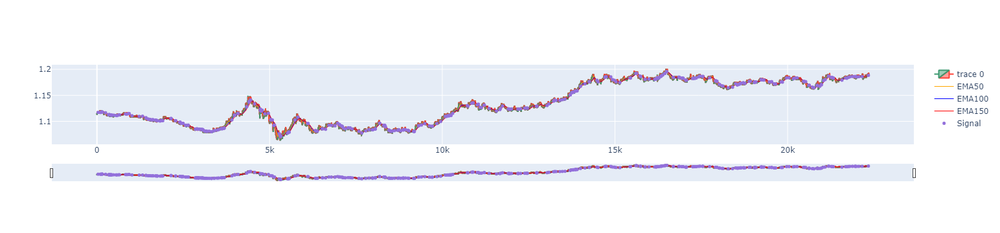

In [30]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime
dfpl = df[0:22350]
#100:350
fig = go.Figure(data=[go.Candlestick(x=dfpl.index,
                open=dfpl['Open'],
                high=dfpl['High'],
                low=dfpl['Low'],
                close=dfpl['Close']),
                go.Scatter(x=dfpl.index, y=dfpl.EMA50, line=dict(color='orange', width=1), name="EMA50"),
                go.Scatter(x=dfpl.index, y=dfpl.EMA100, line=dict(color='blue', width=1), name="EMA100"),
                go.Scatter(x=dfpl.index, y=dfpl.EMA150, line=dict(color='red', width=1), name="EMA150")])

fig.add_scatter(x=dfpl.index, y=dfpl['pointpos'], mode="markers",
                marker=dict(size=5, color="MediumPurple"),
                name="Signal")
fig.show()

In [31]:
dfpl

,Local time,Open,High,Low,Close,Volume,EMA50,EMA100,EMA150,slopeEMA50,slopeEMA100,slopeEMA150,EMAsignal,TotSignal,pointpos
0,03.01.2020 05:45:00.000 GMT-0800,1.11465,1.11466,1.11373,1.11381,2956.4400,1.115165,1.116605,1.117867,-0.000066,-0.000062,-0.000058,1,0,NaN
1,03.01.2020 06:00:00.000 GMT-0800,1.11380,1.11434,1.11353,1.11411,2604.4200,1.115124,1.116556,1.117817,-0.000058,-0.000059,-0.000056,1,0,NaN
2,03.01.2020 06:15:00.000 GMT-0800,1.11410,1.11491,1.11410,1.11464,2447.9600,1.115105,1.116518,1.117775,-0.000050,-0.000054,-0.000053,1,0,NaN
3,03.01.2020 06:30:00.000 GMT-0800,1.11465,1.11528,1.11462,1.11515,3345.6900,1.115106,1.116491,1.117740,-0.000040,-0.000049,-0.000050,1,0,NaN
4,03.01.2020 06:45:00.000 GMT-0800,1.11514,1.11541,1.11495,1.11522,2781.8100,1.115111,1.116466,1.117707,-0.000030,-0.000044,-0.000046,1,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22345,25.11.2020 00:00:00.000 GMT-0800,1.19066,1.19297,1.19037,1.19269,9212.5000,1.189721,1.188708,1.188091,0.000033,0.000036,0.000032,2,0,NaN
22346,25.11.2020 00:15:00.000 GMT-0800,1.19270,1.19271,1.19150,1.19173,10021.8900,1.189800,1.188768,1.188139,0.000039,0.000039,0.000034,2,0,NaN
22347,25.11.2020 00:30:00.000 GMT-0800,1.19173,1.19201,1.19076,1.19081,7573.7000,1.189840,1.188808,1.188175,0.000041,0.000040,0.000035,2,0,NaN
22348,25.11.2020 00:45:00.000 GMT-0800,1.19082,1.19101,1.19009,1.19097,12077.6099,1.189884,1.188851,1.188212,0.000046,0.000043,0.000037,2,0,NaN


## Backtesting Strategy

In [32]:
def SIGNAL():
    return dfpl.TotSignal

In [33]:
from backtesting import Strategy
class MyStrat(Strategy):
    initsize = 0.3
    mysize = initsize
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)

    def next(self):
        super().next()
        
        #if(self.signal1>0 and len(self.trades)==0 and len(self.closed_trades)>0 and self.closed_trades[-1].pl < 0):
        #    self.mysize=self.mysize*2
        #elif len(self.closed_trades)>0 and self.closed_trades[-1].pl > 0:
        #    self.mysize=self.initsize

        if self.signal1==2 and len(self.trades)==0:   
            sl1 = self.data.Close[-1] - 40e-4
            tp1 = self.data.Close[-1] + 40e-4
            self.buy(sl=sl1, tp=tp1, size=self.mysize)
        
        elif self.signal1==1 and len(self.trades)==0:         
            sl1 = self.data.Close[-1] + 40e-4
            tp1 = self.data.Close[-1] - 40e-4
            self.sell(sl=sl1, tp=tp1, size=self.mysize)

In [34]:
from backtesting import Backtest

bt = Backtest(dfpl, MyStrat, cash=100, margin=1/100, commission=.00)
stat = bt.run()
stat

C:\Users\deerr\anaconda3\envs\dev\envs\dev\lib\site-packages\ipykernel_launcher.py:3: UserWarning:

Data index is not datetime. Assuming simple periods, but `pd.DateTimeIndex` is advised.



Start                                     0.0
End                                   22349.0
Duration                              22349.0
Exposure Time [%]                   46.563758
Equity Final [$]                    178.59602
Equity Peak [$]                     246.02952
Return [%]                           78.59602
Buy & Hold Return [%]                6.903332
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -67.938639
Avg. Drawdown [%]                   -5.105569
Max. Drawdown Duration                17185.0
Avg. Drawdown Duration             344.222222
# Trades                                167.0
Win Rate [%]                        54.491018
Best Trade [%]                       0.397073
Worst Trade [%]                      -0.39496
Avg. Trade [%]                    

In [35]:
bt.plot()

Row(id='1456', ...)